In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
pd.set_option('display.max_columns', None)
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.metrics import classification_report

### *DATA DICTIONARY*

#### *Load data*

In [ ]:
df_L = pd.read_csv("SBAnational.csv", header=0)

<ipython-input-4-9c48167c497d>:1: DtypeWarning: Columns (9) have mixed types. Specify dtype option on import or set low_memory=False.
  df_L = pd.read_csv("SBAnational.csv", header=0)


In [ ]:
df_L.head()

,LoanNr_ChkDgt,Name,City,State,Zip,Bank,BankState,NAICS,ApprovalDate,ApprovalFY,Term,NoEmp,NewExist,CreateJob,RetainedJob,FranchiseCode,UrbanRural,RevLineCr,LowDoc,ChgOffDate,DisbursementDate,DisbursementGross,BalanceGross,MIS_Status,ChgOffPrinGr,GrAppv,SBA_Appv
0,1000014003,ABC HOBBYCRAFT,EVANSVILLE,IN,47711,FIFTH THIRD BANK,OH,451120,28-Feb-97,1997,84,4,2.0,0,0,1,0,N,Y,NaN,28-Feb-99,"$60,000.00",$0.00,P I F,$0.00,"$60,000.00","$48,000.00"
1,1000024006,LANDMARK BAR & GRILLE (THE),NEW PARIS,IN,46526,1ST SOURCE BANK,IN,722410,28-Feb-97,1997,60,2,2.0,0,0,1,0,N,Y,NaN,31-May-97,"$40,000.00",$0.00,P I F,$0.00,"$40,000.00","$32,000.00"
2,1000034009,"WHITLOCK DDS, TODD M.",BLOOMINGTON,IN,47401,GRANT COUNTY STATE BANK,IN,621210,28-Feb-97,1997,180,7,1.0,0,0,1,0,N,N,NaN,31-Dec-97,"$287,000.00",$0.00,P I F,$0.00,"$287,000.00","$215,250.00"
3,1000044001,"BIG BUCKS PAWN & JEWELRY, LLC",BROKEN ARROW,OK,74012,1ST NATL BK & TR CO OF BROKEN,OK,0,28-Feb-97,1997,60,2,1.0,0,0,1,0,N,Y,NaN,30-Jun-97,"$35,000.00",$0.00,P I F,$0.00,"$35,000.00","$28,000.00"
4,1000054004,"ANASTASIA CONFECTIONS, INC.",ORLANDO,FL,32801,FLORIDA BUS. DEVEL CORP,FL,0,28-Feb-97,1997,240,14,1.0,7,7,1,0,N,N,NaN,14-May-97,"$229,000.00",$0.00,P I F,$0.00,"$229,000.00","$229,000.00"


In [ ]:
df_L['ApprovalFY'].value_counts()

,count
ApprovalFY,
2006,76040
2007,71876
2003,58193
2005,52912
1995,45758
...,...
1968,1
1962,1
1967,1


### A. Use sample of 2006 and 2007 data from approval fy as work data.
and save it as SBAnational_100k.csv

In [ ]:
# extracting a 100k rows dataset
np.random.seed(20)
df = df_L[df_L['ApprovalFY'].isin([2006,2007])]


In [ ]:
#save
df.to_csv('SBAnational_100k.csv', index=False)

In [ ]:
#Load
df = pd.read_csv('SBAnational_100k.csv')

In [ ]:
df['LoanNr_ChkDgt'].value_counts()

,count
LoanNr_ChkDgt,
1000146010,1
2474316009,1
2475086003,1
2475095010,1
2475106007,1
...,...
1992555010,1
1992575005,1
1992585008,1


In [ ]:
df['ApprovalFY'] = df['ApprovalFY'].astype(int)

In [ ]:
df.head()

,LoanNr_ChkDgt,Name,City,State,Zip,Bank,BankState,NAICS,ApprovalDate,ApprovalFY,Term,NoEmp,NewExist,CreateJob,RetainedJob,FranchiseCode,UrbanRural,RevLineCr,LowDoc,ChgOffDate,DisbursementDate,DisbursementGross,BalanceGross,MIS_Status,ChgOffPrinGr,GrAppv,SBA_Appv
0,1000146010,CARVEL,APEX,NC,27502,STEARNS BK NATL ASSOC,MN,445299,7-Feb-06,2006,162,2,2.0,0,0,15100,1,N,N,NaN,31-Mar-06,"$253,400.00",$0.00,P I F,$0.00,"$253,400.00","$190,050.00"
1,1000446006,SUBWAY,LITTLE ROCK,AR,72223,HOPE FCU,MS,722211,7-Feb-06,2006,126,7,1.0,0,0,1,1,N,N,NaN,30-Apr-06,"$137,300.00",$0.00,P I F,$0.00,"$137,300.00","$116,705.00"
2,1000506000,WEYLAND CORPORATION,CAMARILLO,CA,93010,WELLS FARGO BANK NATL ASSOC,SD,611110,7-Feb-06,2006,83,18,2.0,5,23,1,1,Y,N,NaN,28-Feb-06,"$438,541.00",$0.00,P I F,$0.00,"$100,000.00","$50,000.00"
3,1000516003,CHICAGO BRICK UNLIMITED INC,MIAMI,FL,33186,"CITIBANK, N.A.",FL,238140,7-Feb-06,2006,84,4,1.0,0,4,1,1,Y,N,NaN,28-Feb-06,"$51,440.00",$0.00,P I F,$0.00,"$35,000.00","$17,500.00"
4,1000526006,"RZI, INC.",NEW ORLEANS,LA,70130,BUSINESS RES. CAP. SPECIALTY B,LA,532490,7-Feb-06,2006,60,3,1.0,0,0,1,1,N,N,NaN,31-May-06,"$50,000.00",$0.00,P I F,$0.00,"$50,000.00","$42,500.00"


In [ ]:
df['ApprovalFY'].dtype

dtype('int64')

## **1.EDA**

### *Loading sample dataset*

In [ ]:
# load sample code for backup
df = pd.read_csv("SBAnational_100k.csv", header=0)

In [ ]:
df.shape

(147916, 27)

In [ ]:
df.head()

,LoanNr_ChkDgt,Name,City,State,Zip,Bank,BankState,NAICS,ApprovalDate,ApprovalFY,Term,NoEmp,NewExist,CreateJob,RetainedJob,FranchiseCode,UrbanRural,RevLineCr,LowDoc,ChgOffDate,DisbursementDate,DisbursementGross,BalanceGross,MIS_Status,ChgOffPrinGr,GrAppv,SBA_Appv
0,1000146010,CARVEL,APEX,NC,27502,STEARNS BK NATL ASSOC,MN,445299,7-Feb-06,2006,162,2,2.0,0,0,15100,1,N,N,NaN,31-Mar-06,"$253,400.00",$0.00,P I F,$0.00,"$253,400.00","$190,050.00"
1,1000446006,SUBWAY,LITTLE ROCK,AR,72223,HOPE FCU,MS,722211,7-Feb-06,2006,126,7,1.0,0,0,1,1,N,N,NaN,30-Apr-06,"$137,300.00",$0.00,P I F,$0.00,"$137,300.00","$116,705.00"
2,1000506000,WEYLAND CORPORATION,CAMARILLO,CA,93010,WELLS FARGO BANK NATL ASSOC,SD,611110,7-Feb-06,2006,83,18,2.0,5,23,1,1,Y,N,NaN,28-Feb-06,"$438,541.00",$0.00,P I F,$0.00,"$100,000.00","$50,000.00"
3,1000516003,CHICAGO BRICK UNLIMITED INC,MIAMI,FL,33186,"CITIBANK, N.A.",FL,238140,7-Feb-06,2006,84,4,1.0,0,4,1,1,Y,N,NaN,28-Feb-06,"$51,440.00",$0.00,P I F,$0.00,"$35,000.00","$17,500.00"
4,1000526006,"RZI, INC.",NEW ORLEANS,LA,70130,BUSINESS RES. CAP. SPECIALTY B,LA,532490,7-Feb-06,2006,60,3,1.0,0,0,1,1,N,N,NaN,31-May-06,"$50,000.00",$0.00,P I F,$0.00,"$50,000.00","$42,500.00"


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 147916 entries, 0 to 147915
Data columns (total 27 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   LoanNr_ChkDgt      147916 non-null  int64  
 1   Name               147913 non-null  object 
 2   City               147916 non-null  object 
 3   State              147916 non-null  object 
 4   Zip                147916 non-null  int64  
 5   Bank               147911 non-null  object 
 6   BankState          147911 non-null  object 
 7   NAICS              147916 non-null  int64  
 8   ApprovalDate       147916 non-null  object 
 9   ApprovalFY         147916 non-null  int64  
 10  Term               147916 non-null  int64  
 11  NoEmp              147916 non-null  int64  
 12  NewExist           147916 non-null  float64
 13  CreateJob          147916 non-null  int64  
 14  RetainedJob        147916 non-null  int64  
 15  FranchiseCode      147916 non-null  int64  
 16  Ur

In [ ]:
df.dtypes

,0
LoanNr_ChkDgt,int64
Name,object
City,object
State,object
Zip,int64
Bank,object
BankState,object
NAICS,int64
ApprovalDate,object
ApprovalFY,int64


In [ ]:
# numerical columns
df.describe(include=np.number)

,LoanNr_ChkDgt,Zip,NAICS,ApprovalFY,Term,NoEmp,NewExist,CreateJob,RetainedJob,FranchiseCode,UrbanRural
count,1.479160e+05,147916.000000,147916.00000,147916.000000,147916.000000,147916.000000,147916.000000,147916.000000,147916.000000,147916.000000,147916.000000
mean,2.658565e+09,53145.930447,514891.03744,2006.485924,79.295249,6.770133,1.321703,2.395853,5.793998,1605.532248,1.184145
std,1.870109e+09,30920.297015,169009.13452,0.499804,54.391684,36.020747,0.467623,14.243659,32.729665,9859.412653,0.394107
min,1.000146e+09,0.000000,0.00000,2006.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.852493e+09,27614.000000,424690.00000,2006.000000,50.000000,1.000000,1.000000,0.000000,1.000000,0.000000,1.000000
50%,2.239030e+09,53593.000000,522310.00000,2006.000000,81.000000,3.000000,1.000000,0.000000,3.000000,0.000000,1.000000
75%,2.585785e+09,83854.000000,621320.00000,2007.000000,84.000000,6.000000,2.000000,2.000000,6.000000,1.000000,1.000000
max,9.928233e+09,99928.000000,928120.00000,2007.000000,360.000000,8000.000000,2.000000,2020.000000,9500.000000,91450.000000,2.000000


insight


In [ ]:
# categorical columns
df.describe(include=['object'])

,Name,City,State,Bank,BankState,ApprovalDate,RevLineCr,LowDoc,ChgOffDate,DisbursementDate,DisbursementGross,BalanceGross,MIS_Status,ChgOffPrinGr,GrAppv,SBA_Appv
count,147913,147916,147916,147911,147911,147916,147910,147806,58900,147681,147916,147916,147405,147916,147916,147916
unique,137607,14706,51,2294,52,648,6,6,1927,256,50251,3,2,36236,5616,7519
top,SUBWAY,LOS ANGELES,CA,BANK OF AMERICA NATL ASSOC,NC,29-Sep-06,Y,N,13-Mar-10,30-Apr-07,"$25,000.00",$0.00,P I F,$0.00,"$25,000.00","$12,500.00"
freq,84,2282,21418,20044,21641,426,66576,147615,417,6462,7042,147914,90230,89016,17730,15575


In [ ]:
# Num and Cat column variables

num_cols = df.select_dtypes(include=np.number).columns
cat_cols = df.select_dtypes(include=['object', 'category']).columns

print("Number of Numeric Variables:", len(num_cols))
print("Number of Categorical Variables:", len(cat_cols))
print("Numeric Variables:-\n", num_cols)
print("Categorical Variables:-\n", cat_cols)

Number of Numeric Variables: 11
Number of Categorical Variables: 16
Numeric Variables:-
 Index(['LoanNr_ChkDgt', 'Zip', 'NAICS', 'ApprovalFY', 'Term', 'NoEmp',
       'NewExist', 'CreateJob', 'RetainedJob', 'FranchiseCode', 'UrbanRural'],
      dtype='object')
Categorical Variables:-
 Index(['Name', 'City', 'State', 'Bank', 'BankState', 'ApprovalDate',
       'RevLineCr', 'LowDoc', 'ChgOffDate', 'DisbursementDate',
       'DisbursementGross', 'BalanceGross', 'MIS_Status', 'ChgOffPrinGr',
       'GrAppv', 'SBA_Appv'],
      dtype='object')


### ***NULL Value Handling***

In [ ]:
# missing values
df.isnull().sum()

,0
LoanNr_ChkDgt,0
Name,3
City,0
State,0
Zip,0
Bank,5
BankState,5
NAICS,0
ApprovalDate,0
ApprovalFY,0


In [ ]:
all_null = df.isnull().sum()
null_columns = all_null[all_null>0]
null_columns

,0
Name,3
Bank,5
BankState,5
RevLineCr,6
LowDoc,110
ChgOffDate,89016
DisbursementDate,235
MIS_Status,511


In [ ]:
# since all other columns other than chgoffdate have less number of null rows, we can opt to drop them
df_cleaned = df.dropna(subset=['Name', 'Bank', 'BankState', 'RevLineCr', 'LowDoc', 'DisbursementDate', 'MIS_Status'])

In [ ]:
df_cleaned = df_cleaned.drop(['ChgOffDate'], axis=1)

In [ ]:
all_null = df_cleaned.isnull().sum()
null_columns = all_null[all_null>0]
null_columns

,0


In [ ]:
df_cleaned.shape

(147063, 26)

In [ ]:
df_cleaned.isnull().sum()

,0
LoanNr_ChkDgt,0
Name,0
City,0
State,0
Zip,0
Bank,0
BankState,0
NAICS,0
ApprovalDate,0
ApprovalFY,0


In [ ]:
df_cleaned.shape

(147063, 26)

### ***Save Load Point***

In [ ]:
#Save
df_cleaned.to_csv('SBAnational_100k_cleaned.csv', index=False)

In [ ]:
#load
df_cleaned = pd.read_csv('SBAnational_100k_cleaned.csv')

## **Data Cleaning**

### *Numerical Columns*

In [ ]:
df_cleaned.head()

,LoanNr_ChkDgt,Name,City,State,Zip,Bank,BankState,NAICS,ApprovalDate,ApprovalFY,Term,NoEmp,NewExist,CreateJob,RetainedJob,FranchiseCode,UrbanRural,RevLineCr,LowDoc,DisbursementDate,DisbursementGross,BalanceGross,MIS_Status,ChgOffPrinGr,GrAppv,SBA_Appv
0,1000146010,CARVEL,APEX,NC,27502,STEARNS BK NATL ASSOC,MN,445299,7-Feb-06,2006,162,2,2.0,0,0,15100,1,N,N,31-Mar-06,"$253,400.00",$0.00,P I F,$0.00,"$253,400.00","$190,050.00"
1,1000446006,SUBWAY,LITTLE ROCK,AR,72223,HOPE FCU,MS,722211,7-Feb-06,2006,126,7,1.0,0,0,1,1,N,N,30-Apr-06,"$137,300.00",$0.00,P I F,$0.00,"$137,300.00","$116,705.00"
2,1000506000,WEYLAND CORPORATION,CAMARILLO,CA,93010,WELLS FARGO BANK NATL ASSOC,SD,611110,7-Feb-06,2006,83,18,2.0,5,23,1,1,Y,N,28-Feb-06,"$438,541.00",$0.00,P I F,$0.00,"$100,000.00","$50,000.00"
3,1000516003,CHICAGO BRICK UNLIMITED INC,MIAMI,FL,33186,"CITIBANK, N.A.",FL,238140,7-Feb-06,2006,84,4,1.0,0,4,1,1,Y,N,28-Feb-06,"$51,440.00",$0.00,P I F,$0.00,"$35,000.00","$17,500.00"
4,1000526006,"RZI, INC.",NEW ORLEANS,LA,70130,BUSINESS RES. CAP. SPECIALTY B,LA,532490,7-Feb-06,2006,60,3,1.0,0,0,1,1,N,N,31-May-06,"$50,000.00",$0.00,P I F,$0.00,"$50,000.00","$42,500.00"


In [ ]:
# LoanNr_ChkDgt is an ID column which is not of use in prediction
df_cleaned = df_cleaned.drop(labels=['LoanNr_ChkDgt'], axis=1)

In [ ]:
# update num columns
num_cols = df_cleaned.select_dtypes(include=np.number).columns

In [ ]:
# value count checks - Before Actions
for col in num_cols:
    print(f"{col}':")
    print(df_cleaned[col].value_counts())
    print()

Zip':
Zip
90010    273
10001    218
11354    208
48126    203
90015    195
        ... 
23665      1
42408      1
17408      1
38921      1
3          1
Name: count, Length: 17968, dtype: int64

NAICS':
NAICS
722110    6391
722211    4942
812112    2541
238990    2343
484110    2162
          ... 
813940       1
311213       1
522130       1
561311       1
0            1
Name: count, Length: 1198, dtype: int64

ApprovalFY':
ApprovalFY
2006    75657
2007    71406
Name: count, dtype: int64

Term':
Term
84     46900
60     11163
240     7371
120     5419
36      2807
       ...  
321        1
318        1
315        1
316        1
320        1
Name: count, Length: 318, dtype: int64

NoEmp':
NoEmp
1       35236
2       27923
3       16333
4       12708
5       10008
        ...  
139         1
520         1
2151        1
316         1
3713        1
Name: count, Length: 211, dtype: int64

NewExist':
NewExist
1.0    99704
2.0    47325
0.0       34
Name: count, dtype: int64

CreateJob':
Creat

In [ ]:
#removed Zip, NAICS and FranchiseCode columns as they were codes

df_cleaned = df_cleaned.drop(labels=['Zip', 'NAICS', 'FranchiseCode'], axis=1)

In [ ]:
# New_exists, replacing 0 since it's an anomaly(buisness applicants can't have 0 buisnesses)
most_freq_val = df_cleaned['NewExist'].mode()[0]
df_cleaned['NewExist'] = df_cleaned['NewExist'].replace(to_replace=0, value= most_freq_val)
# there were only 34 values with 0 that's why we used this method.

In [ ]:
df_cleaned['NewExist'].value_counts()

,count
NewExist,
1.0,99738
2.0,47325


In [ ]:
# value count checks - After actions
for col in [c for c in num_cols if c not in ['Zip', 'NAICS', 'FranchiseCode']]:
    print(f"{col}':")
    print(df_cleaned[col].value_counts())
    print()

ApprovalFY':
ApprovalFY
2006    75657
2007    71406
Name: count, dtype: int64

Term':
Term
84     46900
60     11163
240     7371
120     5419
36      2807
       ...  
321        1
318        1
315        1
316        1
320        1
Name: count, Length: 318, dtype: int64

NoEmp':
NoEmp
1       35236
2       27923
3       16333
4       12708
5       10008
        ...  
139         1
520         1
2151        1
316         1
3713        1
Name: count, Length: 211, dtype: int64

NewExist':
NewExist
1.0    99738
2.0    47325
Name: count, dtype: int64

CreateJob':
CreateJob
0      82560
1      19724
2      15893
3       7005
4       4680
       ...  
104        1
174        1
84         1
458        1
106        1
Name: count, Length: 125, dtype: int64

RetainedJob':
RetainedJob
1      29459
2      24440
0      17332
3      15392
4      12042
       ...  
430        1
220        1
176        1
610        1
113        1
Name: count, Length: 189, dtype: int64

UrbanRural':
UrbanRural
1    11

### *Categorical Columns*

In [ ]:
#update cat columns
cat_cols = df_cleaned.select_dtypes(include='object').columns
cat_cols

Index(['Name', 'City', 'State', 'Bank', 'BankState', 'ApprovalDate',
       'RevLineCr', 'LowDoc', 'DisbursementDate', 'DisbursementGross',
       'BalanceGross', 'MIS_Status', 'ChgOffPrinGr', 'GrAppv', 'SBA_Appv'],
      dtype='object')

In [ ]:
df_cleaned[cat_cols].isnull().sum()

,0
Name,0
City,0
State,0
Bank,0
BankState,0
ApprovalDate,0
RevLineCr,0
LowDoc,0
DisbursementDate,0
DisbursementGross,0


In [ ]:
df_cleaned.shape

(147063, 22)

In [ ]:
# value count checks
for col in cat_cols:
    print(f"{col}':")
    print(df_cleaned[col].value_counts())
    print()

Name':
Name
SUBWAY                         84
COLD STONE CREAMERY            69
EDIBLE ARRANGEMENTS            39
THE UPS STORE                  39
MASSAGE ENVY                   37
                               ..
Frontline Call Center           1
GURU KIRPA, INC.                1
Pax Rx LLC                      1
Anime-Zing Escape               1
PAK MAIL OF BURLINGTON #397     1
Name: count, Length: 137105, dtype: int64

City':
City
LOS ANGELES                       2277
NEW YORK                          1743
HOUSTON                           1729
CHICAGO                           1686
BROOKLYN                          1489
                                  ... 
STATON ISLAND                        1
LIBBY                                1
Gallitzin                            1
CHERITON                             1
HOULTON (CENSUS NAME FOR HOULT       1
Name: count, Length: 14688, dtype: int64

State':
State
CA    21352
NY    11736
TX    10620
FL     8859
IL     6574
OH     6037
PA

### C. use wordcloud (a type of graph visualisation) to visualise the distributions in cat_cols like the above code.

In [ ]:
#save
df_cleaned.to_csv('Word_cloud.csv', index=False)

SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY SUBWAY COLD STONE CREAMERY COLD STONE CREAMERY COLD STONE CREAMERY COLD STONE CREAMERY COLD STONE CREAMERY COLD STONE CREAMERY COLD STONE CREAMERY COLD STONE CREAMERY COLD STONE CREAMERY COLD STONE CREAMERY COLD STONE CREAMERY COLD STONE CREAMERY COLD STONE CREAMERY COLD STONE CREAMERY COLD STONE CREAMERY COLD STONE CREAMERY COLD STONE CREAMERY COLD STONE CREAMERY COLD STONE CREAMERY COLD STONE CREAMERY COLD STONE C

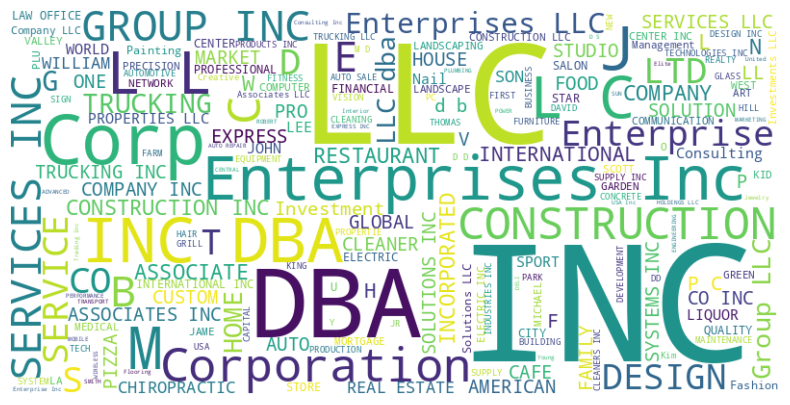

LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS ANGELES LOS 

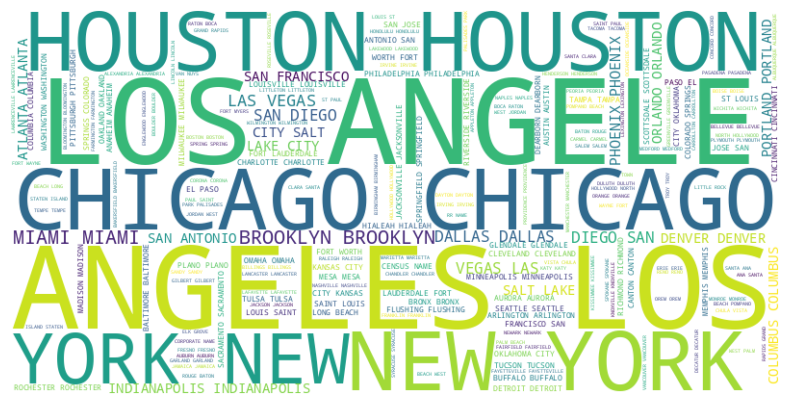

CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA CA C

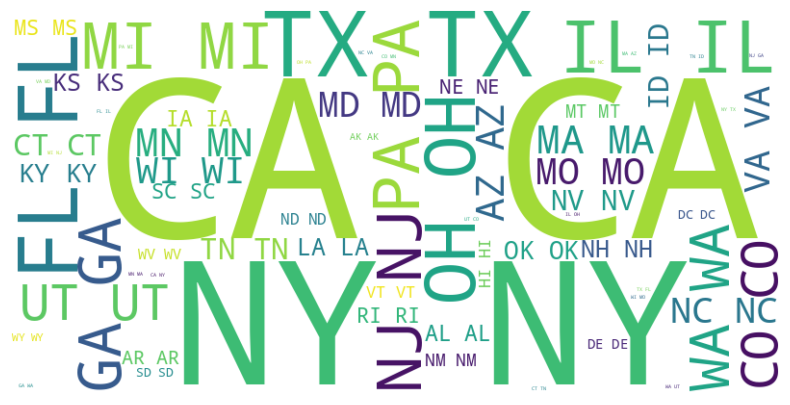

BANK OF AMERICA NATL ASSOC BANK OF AMERICA NATL ASSOC BANK OF AMERICA NATL ASSOC BANK OF AMERICA NATL ASSOC BANK OF AMERICA NATL ASSOC BANK OF AMERICA NATL ASSOC BANK OF AMERICA NATL ASSOC BANK OF AMERICA NATL ASSOC BANK OF AMERICA NATL ASSOC BANK OF AMERICA NATL ASSOC BANK OF AMERICA NATL ASSOC BANK OF AMERICA NATL ASSOC BANK OF AMERICA NATL ASSOC BANK OF AMERICA NATL ASSOC BANK OF AMERICA NATL ASSOC BANK OF AMERICA NATL ASSOC BANK OF AMERICA NATL ASSOC BANK OF AMERICA NATL ASSOC BANK OF AMERICA NATL ASSOC BANK OF AMERICA NATL ASSOC BANK OF AMERICA NATL ASSOC BANK OF AMERICA NATL ASSOC BANK OF AMERICA NATL ASSOC BANK OF AMERICA NATL ASSOC BANK OF AMERICA NATL ASSOC BANK OF AMERICA NATL ASSOC BANK OF AMERICA NATL ASSOC BANK OF AMERICA NATL ASSOC BANK OF AMERICA NATL ASSOC BANK OF AMERICA NATL ASSOC BANK OF AMERICA NATL ASSOC BANK OF AMERICA NATL ASSOC BANK OF AMERICA NATL ASSOC BANK OF AMERICA NATL ASSOC BANK OF AMERICA NATL ASSOC BANK OF AMERICA NATL ASSOC BANK OF AMERICA NATL ASSOC B

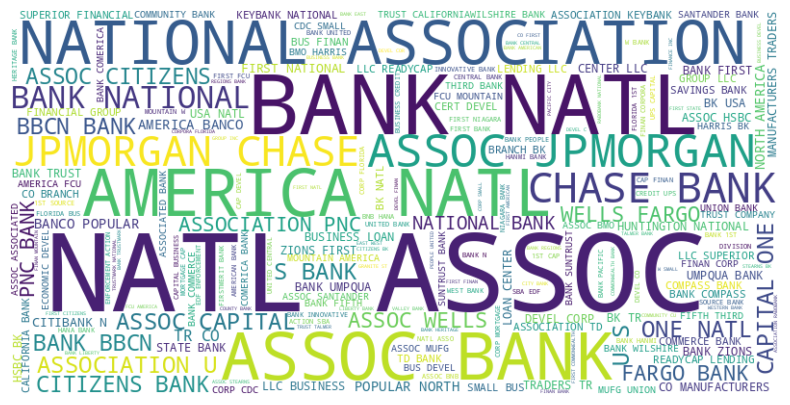

NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC NC N

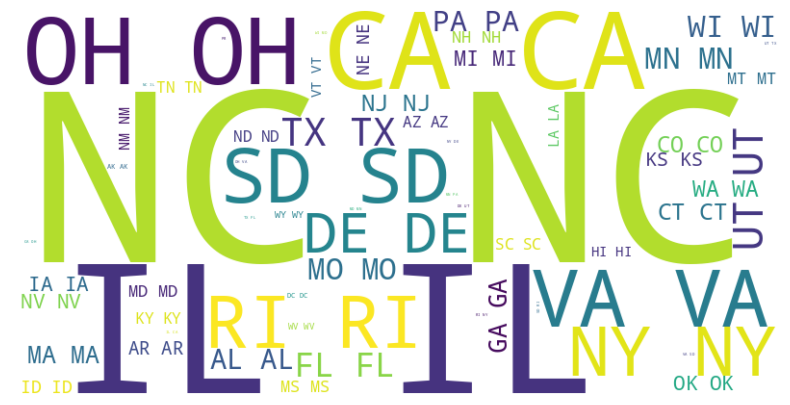

29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 29-Sep-06 

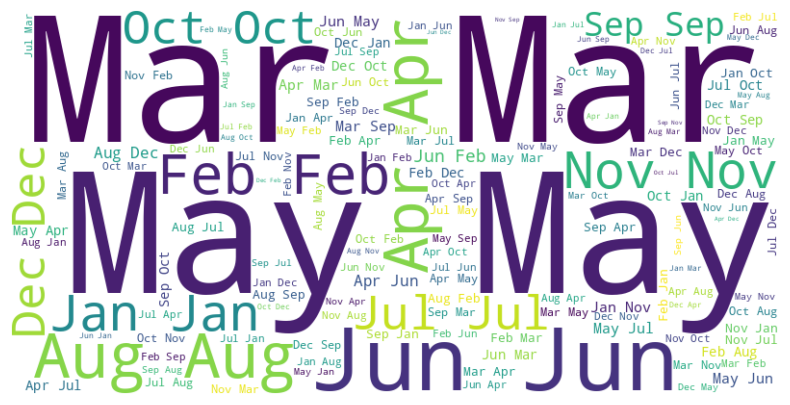

Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y Y 

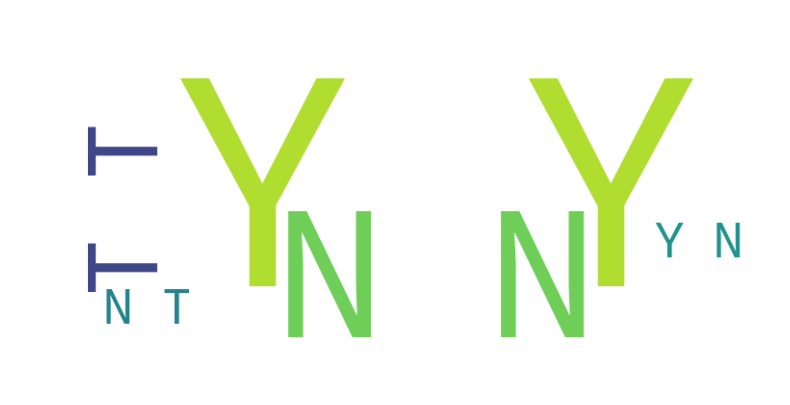

N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N N 

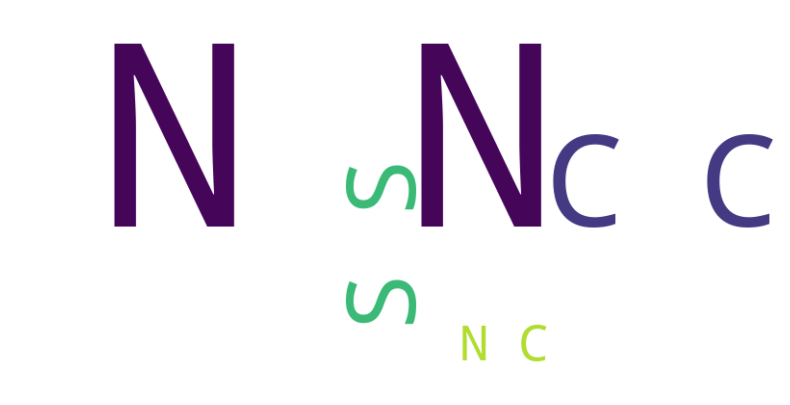

30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 30-Apr-07 

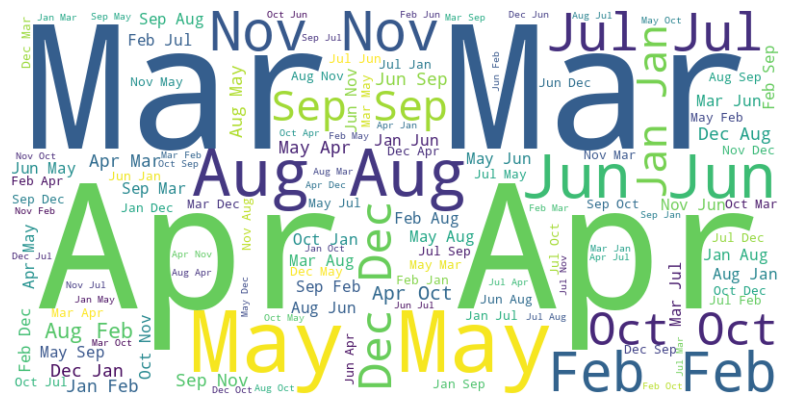

$25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,000.00  $25,

ValueError: We need at least 1 word to plot a word cloud, got 0.

In [ ]:
# the code is acting beyond the data rate capacity when ran
from wordcloud import WordCloud
for col in cat_cols:
    # Count the frequency of each category
    category_counts = df_cleaned[col].value_counts()

    # Create a single string with each category repeated according to its frequency
    category_text = ' '.join(category_counts.index.repeat(category_counts))

    print(category_text)


    # Create the word cloud
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(category_text)

    # Display the word cloud
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.show()

In [ ]:
df_cleaned = df_cleaned.drop(labels=['City', 'Bank'], axis=1)

In [ ]:
df_cleaned.shape

(147063, 20)

In [ ]:
cat_cols = df_cleaned.select_dtypes(include='object').columns
cat_cols

Index(['Name', 'State', 'BankState', 'ApprovalDate', 'RevLineCr', 'LowDoc',
       'DisbursementDate', 'DisbursementGross', 'BalanceGross', 'MIS_Status',
       'ChgOffPrinGr', 'GrAppv', 'SBA_Appv'],
      dtype='object')

In [ ]:
df_cleaned[cat_cols].head()

,Name,State,BankState,ApprovalDate,RevLineCr,LowDoc,DisbursementDate,DisbursementGross,BalanceGross,MIS_Status,ChgOffPrinGr,GrAppv,SBA_Appv
0,CARVEL,NC,MN,7-Feb-06,N,N,31-Mar-06,"$253,400.00",$0.00,P I F,$0.00,"$253,400.00","$190,050.00"
1,SUBWAY,AR,MS,7-Feb-06,N,N,30-Apr-06,"$137,300.00",$0.00,P I F,$0.00,"$137,300.00","$116,705.00"
2,WEYLAND CORPORATION,CA,SD,7-Feb-06,Y,N,28-Feb-06,"$438,541.00",$0.00,P I F,$0.00,"$100,000.00","$50,000.00"
3,CHICAGO BRICK UNLIMITED INC,FL,FL,7-Feb-06,Y,N,28-Feb-06,"$51,440.00",$0.00,P I F,$0.00,"$35,000.00","$17,500.00"
4,"RZI, INC.",LA,LA,7-Feb-06,N,N,31-May-06,"$50,000.00",$0.00,P I F,$0.00,"$50,000.00","$42,500.00"


In [ ]:
# cleaning misclassified cat columns
fix_cols = ['DisbursementGross', 'BalanceGross', 'ChgOffPrinGr', 'GrAppv', 'SBA_Appv']

df_cleaned['DisbursementGross'] = df_cleaned['DisbursementGross'].str.replace("$",'').str.replace(",",'').str.replace(" ", '')

In [ ]:
df_cleaned['BalanceGross'] = df_cleaned['BalanceGross'].str.replace("$",'').str.replace(",",'').str.replace(" ", '')
df_cleaned['ChgOffPrinGr'] = df_cleaned['ChgOffPrinGr'].str.replace("$",'').str.replace(",",'').str.replace(" ", '')
df_cleaned['GrAppv'] = df_cleaned['GrAppv'].str.replace("$",'').str.replace(",",'').str.replace(" ", '')
df_cleaned['SBA_Appv'] = df_cleaned['SBA_Appv'].str.replace("$",'').str.replace(",",'').str.replace(" ", '')

In [ ]:
df_cleaned['DisbursementGross'] = df_cleaned['DisbursementGross'].astype('float')
df_cleaned['BalanceGross'] = df_cleaned['BalanceGross'].astype('float')
df_cleaned['ChgOffPrinGr'] = df_cleaned['ChgOffPrinGr'].astype('float')
df_cleaned['GrAppv'] = df_cleaned['GrAppv'].astype('float')
df_cleaned['SBA_Appv'] = df_cleaned['SBA_Appv'].astype('float')

In [ ]:
df_cleaned[cat_cols].head()

,Name,State,BankState,ApprovalDate,RevLineCr,LowDoc,DisbursementDate,DisbursementGross,BalanceGross,MIS_Status,ChgOffPrinGr,GrAppv,SBA_Appv
0,CARVEL,NC,MN,7-Feb-06,N,N,31-Mar-06,253400.0,0.0,P I F,0.0,253400.0,190050.0
1,SUBWAY,AR,MS,7-Feb-06,N,N,30-Apr-06,137300.0,0.0,P I F,0.0,137300.0,116705.0
2,WEYLAND CORPORATION,CA,SD,7-Feb-06,Y,N,28-Feb-06,438541.0,0.0,P I F,0.0,100000.0,50000.0
3,CHICAGO BRICK UNLIMITED INC,FL,FL,7-Feb-06,Y,N,28-Feb-06,51440.0,0.0,P I F,0.0,35000.0,17500.0
4,"RZI, INC.",LA,LA,7-Feb-06,N,N,31-May-06,50000.0,0.0,P I F,0.0,50000.0,42500.0


In [ ]:
df_cleaned[cat_cols].dtypes

,0
Name,object
State,object
BankState,object
ApprovalDate,object
RevLineCr,object
LowDoc,object
DisbursementDate,object
DisbursementGross,float64
BalanceGross,float64
MIS_Status,object


In [ ]:
# treating date columns : ApprovalDate, DisbursementDate
df_cleaned['ApprovalDate'] = pd.to_datetime(df_cleaned['ApprovalDate'])
df_cleaned['DisbursementDate'] = pd.to_datetime(df_cleaned['DisbursementDate'])

<ipython-input-55-c9480303deca>:2: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df_cleaned['ApprovalDate'] = pd.to_datetime(df_cleaned['ApprovalDate'])
<ipython-input-55-c9480303deca>:3: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df_cleaned['DisbursementDate'] = pd.to_datetime(df_cleaned['DisbursementDate'])


In [ ]:
# splitting up date feature and creating new year and month features
df_cleaned['Approval_Year'] = df_cleaned['ApprovalDate'].dt.year
df_cleaned['Approval_Month'] = df_cleaned['ApprovalDate'].dt.month
df_cleaned['Disbursement_Year'] = df_cleaned['DisbursementDate'].dt.year
df_cleaned['Disbursement_Month'] = df_cleaned['DisbursementDate'].dt.month

In [ ]:
df_cleaned = df_cleaned.drop(labels=['ApprovalDate', 'DisbursementDate'], axis=1)

In [ ]:
cat_cols = df_cleaned.select_dtypes(include='object').columns
cat_cols

Index(['Name', 'State', 'BankState', 'RevLineCr', 'LowDoc', 'MIS_Status'], dtype='object')

In [ ]:
df_cleaned[cat_cols].dtypes

,0
Name,object
State,object
BankState,object
RevLineCr,object
LowDoc,object
MIS_Status,object


In [ ]:
df_cleaned.head()

,Name,State,BankState,ApprovalFY,Term,NoEmp,NewExist,CreateJob,RetainedJob,UrbanRural,RevLineCr,LowDoc,DisbursementGross,BalanceGross,MIS_Status,ChgOffPrinGr,GrAppv,SBA_Appv,Approval_Year,Approval_Month,Disbursement_Year,Disbursement_Month
0,CARVEL,NC,MN,2006,162,2,2.0,0,0,1,N,N,253400.0,0.0,P I F,0.0,253400.0,190050.0,2006,2,2006,3
1,SUBWAY,AR,MS,2006,126,7,1.0,0,0,1,N,N,137300.0,0.0,P I F,0.0,137300.0,116705.0,2006,2,2006,4
2,WEYLAND CORPORATION,CA,SD,2006,83,18,2.0,5,23,1,Y,N,438541.0,0.0,P I F,0.0,100000.0,50000.0,2006,2,2006,2
3,CHICAGO BRICK UNLIMITED INC,FL,FL,2006,84,4,1.0,0,4,1,Y,N,51440.0,0.0,P I F,0.0,35000.0,17500.0,2006,2,2006,2
4,"RZI, INC.",LA,LA,2006,60,3,1.0,0,0,1,N,N,50000.0,0.0,P I F,0.0,50000.0,42500.0,2006,2,2006,5


In [ ]:
cat_cols = df_cleaned.select_dtypes(include='object').columns
cat_cols

Index(['Name', 'State', 'BankState', 'RevLineCr', 'LowDoc', 'MIS_Status'], dtype='object')

In [ ]:
num_cols = df_cleaned.select_dtypes(include= np.number).columns
num_cols

Index(['ApprovalFY', 'Term', 'NoEmp', 'NewExist', 'CreateJob', 'RetainedJob',
       'UrbanRural', 'DisbursementGross', 'BalanceGross', 'ChgOffPrinGr',
       'GrAppv', 'SBA_Appv', 'Approval_Year', 'Approval_Month',
       'Disbursement_Year', 'Disbursement_Month'],
      dtype='object')

In [ ]:
# value count checks
for col in cat_cols:
    print(f"{col}':")
    print(df_cleaned[col].value_counts())
    print()

Name':
Name
SUBWAY                         84
COLD STONE CREAMERY            69
EDIBLE ARRANGEMENTS            39
THE UPS STORE                  39
MASSAGE ENVY                   37
                               ..
Frontline Call Center           1
GURU KIRPA, INC.                1
Pax Rx LLC                      1
Anime-Zing Escape               1
PAK MAIL OF BURLINGTON #397     1
Name: count, Length: 137105, dtype: int64

State':
State
CA    21352
NY    11736
TX    10620
FL     8859
IL     6574
OH     6037
PA     4968
MI     4903
NJ     4440
GA     4079
WA     3663
UT     3609
CO     3583
MN     3459
MA     3433
AZ     3375
IN     3054
WI     2830
MO     2756
NC     2547
VA     2507
MD     2385
OR     1983
CT     1695
TN     1684
ID     1594
NV     1534
KY     1367
OK     1305
LA     1244
NH     1214
KS     1183
IA     1027
AL      985
RI      903
MS      894
SC      887
NE      781
ME      763
AR      690
MT      646
NM      596
VT      520
HI      500
ND      466
WV      397
DE   

### **Checking feasible way of imputing RevlineCr**

In [ ]:
temp_df = df_cleaned

In [ ]:
mappings = df_cleaned.groupby(by='Name')['RevLineCr'].agg(lambda x: x.value_counts().idxmax())

In [ ]:
mappings

,RevLineCr
Name,
"""IMAGINE THAT""",0
"""MARISCAL FOOD SERVICES"" AND """,0
#1 CAR WASH CENTER,0
#1 CLARENCE WOLLMAN #2 BRANDON,Y
"#1 Dolls NY, Inc.",Y
...,...
"von BULOW ENTERPRISES, LLC",N
vs expo corp,Y
wesley,0


In [ ]:
temp_df['RevLineCr']= temp_df['Name'].map(mappings)

In [ ]:
temp_df['RevLineCr'].value_counts()

,count
RevLineCr,
Y,64928
N,46973
0,30593
T,4563
1,4
R,2


In [ ]:
df_cleaned['RevLineCr'].value_counts()

,count
RevLineCr,
Y,64928
N,46973
0,30593
T,4563
1,4
R,2


In [ ]:
# revlineCr: since dictionary only mentioned yes or no as possible values
df_cleaned['RevLineCr'] = df_cleaned['RevLineCr'].map({"N":"N", "Y":"Y"})

In [ ]:
df_cleaned['RevLineCr'] =  df_cleaned['RevLineCr'].fillna('Unknown')

In [ ]:
df_cleaned['RevLineCr'].value_counts()

,count
RevLineCr,
Y,64928
N,46973
Unknown,35162


In [ ]:
df_cleaned = df_cleaned.drop(labels=['Name'], axis=1)

In [ ]:
df_cleaned['LowDoc'].value_counts()

,count
LowDoc,
N,146872
C,77
A,67
S,38
R,8
1,1


In [ ]:
df_cleaned =  df_cleaned.drop(['LowDoc'], axis=1)

In [ ]:
cat_cols = df_cleaned.select_dtypes(include='object').columns
print(cat_cols)
num_cols = df_cleaned.select_dtypes(include= np.number).columns
print(num_cols)

Index(['State', 'BankState', 'RevLineCr', 'MIS_Status'], dtype='object')
Index(['ApprovalFY', 'Term', 'NoEmp', 'NewExist', 'CreateJob', 'RetainedJob',
       'UrbanRural', 'DisbursementGross', 'BalanceGross', 'ChgOffPrinGr',
       'GrAppv', 'SBA_Appv', 'Approval_Year', 'Approval_Month',
       'Disbursement_Year', 'Disbursement_Month'],
      dtype='object')


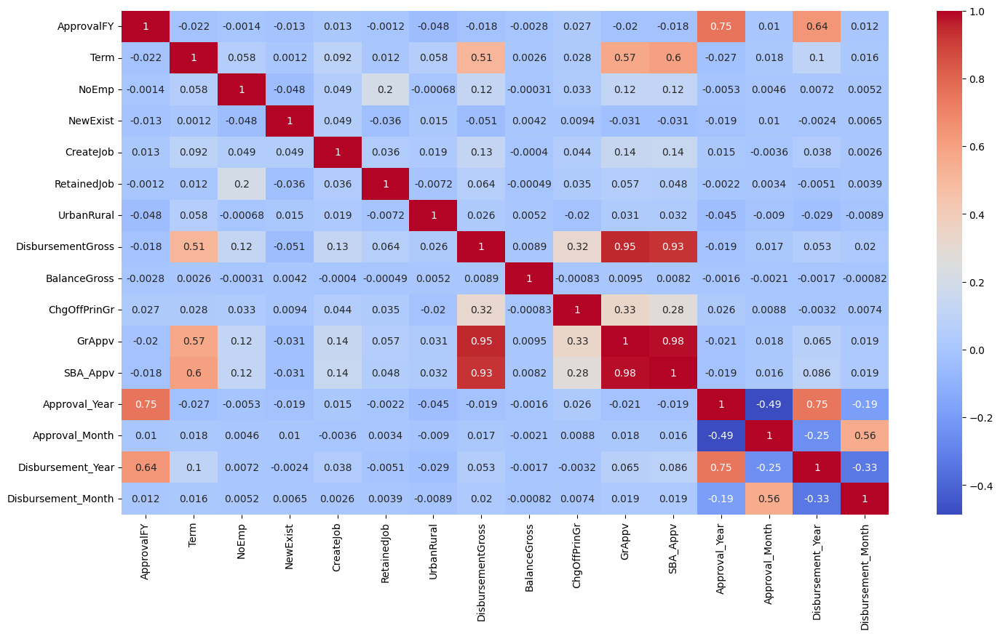

In [ ]:
# Correlation matrix for multi-collinearity
corr_matrix = df_cleaned[num_cols].corr()
plt.figure(figsize=(17,9))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.show()

In [ ]:
df_cleaned = df_cleaned.drop(labels=['DisbursementGross', 'SBA_Appv'], axis=1)

In [ ]:
df_cleaned.shape

(147063, 18)

In [ ]:
df_cleaned.head()

,State,BankState,ApprovalFY,Term,NoEmp,NewExist,CreateJob,RetainedJob,UrbanRural,RevLineCr,BalanceGross,MIS_Status,ChgOffPrinGr,GrAppv,Approval_Year,Approval_Month,Disbursement_Year,Disbursement_Month
0,NC,MN,2006,162,2,2.0,0,0,1,Unknown,0.0,P I F,0.0,253400.0,2006,2,2006,3
1,AR,MS,2006,126,7,1.0,0,0,1,Unknown,0.0,P I F,0.0,137300.0,2006,2,2006,4
2,CA,SD,2006,83,18,2.0,5,23,1,Y,0.0,P I F,0.0,100000.0,2006,2,2006,2
3,FL,FL,2006,84,4,1.0,0,4,1,Y,0.0,P I F,0.0,35000.0,2006,2,2006,2
4,LA,LA,2006,60,3,1.0,0,0,1,N,0.0,P I F,0.0,50000.0,2006,2,2006,5


**Save Point**

In [ ]:
#SAVE
df_cleaned.to_csv('SBA_corrected.csv', index=False)

In [ ]:
#LOAD (result data of all the procedures till above heatmap)
df_cleaned = pd.read_csv('SBA_corrected.csv')

### D. PERFORM EACH OF THE BELOW TASKS
1.chi square consistency               
2.state vs mis status              
3.bankstate vs mis status


In [ ]:
# 2.State vs MIS Status
from scipy.stats import chi2_contingency

contingency_table = pd.crosstab(df_cleaned['State'], df_cleaned['MIS_Status'])
# Perform Chi-Square Test
chi2, p, dof, expected = chi2_contingency(contingency_table)
print("Chi-Square Statistic:", chi2)
print("p-value:", p)
print("Degrees of Freedom:", dof)
print("Expected Frequencies:", expected)

Chi-Square Statistic: 5381.666775914902
p-value: 0.0
Degrees of Freedom: 50
Expected Frequencies: [[   71.78824721   113.21175279]
 [  382.22391084   602.77608916]
 [  267.75075988   422.24924012]
 [ 1309.65045593  2065.34954407]
 [ 8285.52786221 13066.47213779]
 [ 1390.36372847  2192.63627153]
 [  657.73556231  1037.26443769]
 [  126.89057751   200.10942249]
 [  143.57649443   226.42350557]
 [ 3437.68693009  5421.31306991]
 [ 1582.83383992  2496.16616008]
 [  194.02228977   305.97771023]
 [  398.52178318   628.47821682]
 [  618.54305978   975.45694022]
 [ 2551.00506586  4022.99493414]
 [ 1185.0881459   1868.9118541 ]
 [  459.05673759   723.94326241]
 [  530.45694022   836.54305978]
 [  482.72745694   761.27254306]
 [ 1332.15704154  2100.84295846]
 [  925.48632219  1459.51367781]
 [  296.07801418   466.92198582]
 [ 1902.58257345  3000.41742655]
 [ 1342.24620061  2116.75379939]
 [ 1069.4508612   1686.5491388 ]
 [  346.9118541    547.0881459 ]
 [  250.67679838   395.32320162]
 [  988.349

In [ ]:
# 3.BankState vs MIS Status
from scipy.stats import chi2_contingency

contingency_table = pd.crosstab(df_cleaned['BankState'], df_cleaned['MIS_Status'])
# Perform Chi-Square Test
chi2, p, dof, expected = chi2_contingency(contingency_table)
print("Chi-Square Statistic:", chi2)
print("p-value:", p)
print("Degrees of Freedom:", dof)
print("Expected Frequencies:", expected)

Chi-Square Statistic: 8591.655484127072
p-value: 0.0
Degrees of Freedom: 51
Expected Frequencies: [[1.62978723e+01 2.57021277e+01]
 [5.66933131e+02 8.94066869e+02]
 [2.28946302e+02 3.61053698e+02]
 [1.51725431e+02 2.39274569e+02]
 [7.00110030e+03 1.10408997e+04]
 [3.48075988e+02 5.48924012e+02]
 [3.83000000e+02 6.04000000e+02]
 [1.82380952e+01 2.87619048e+01]
 [2.68410436e+03 4.23289564e+03]
 [8.64951368e+02 1.36404863e+03]
 [4.67205674e+02 7.36794326e+02]
 [1.17189463e+02 1.84810537e+02]
 [2.72795339e+02 4.30204661e+02]
 [2.01007092e+02 3.16992908e+02]
 [7.01002533e+03 1.10549747e+04]
 [4.28789260e+02 6.76210740e+02]
 [2.43691996e+02 3.84308004e+02]
 [1.46680851e+02 2.31319149e+02]
 [1.29606890e+02 2.04393110e+02]
 [4.30341439e+02 6.78658561e+02]
 [1.76948328e+02 2.79051672e+02]
 [1.47844985e+02 2.33155015e+02]
 [3.14704154e+02 4.96295846e+02]
 [6.64720365e+02 1.04827964e+03]
 [6.74421479e+02 1.06357852e+03]
 [1.78888551e+02 2.82111449e+02]
 [1.83933131e+02 2.90066869e+02]
 [8.3705096

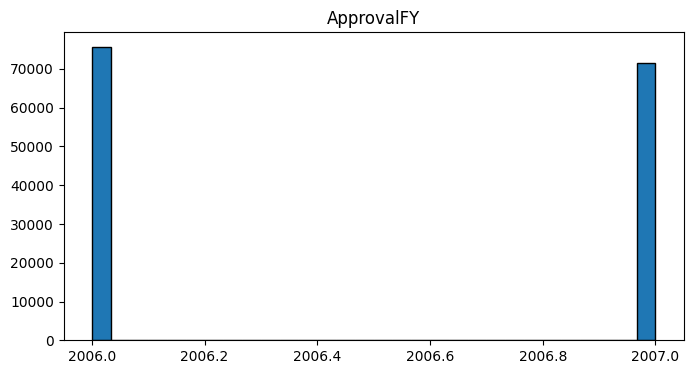

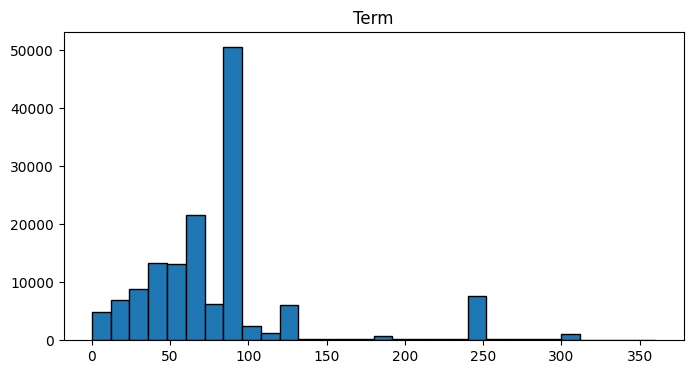

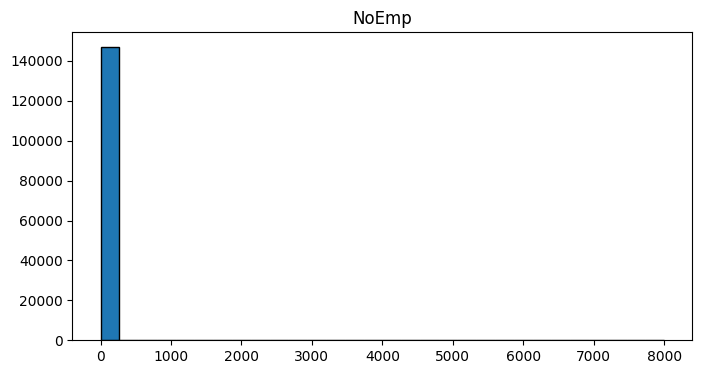

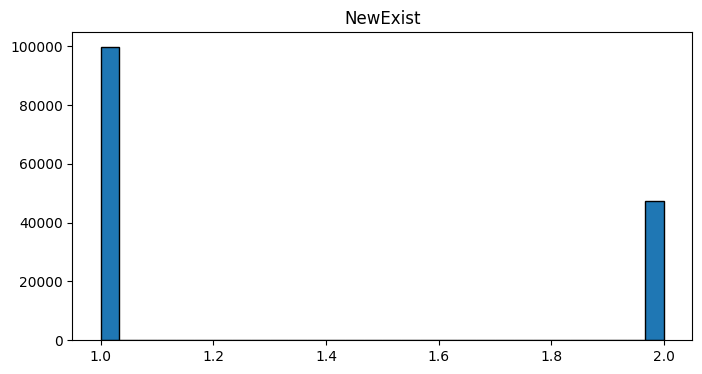

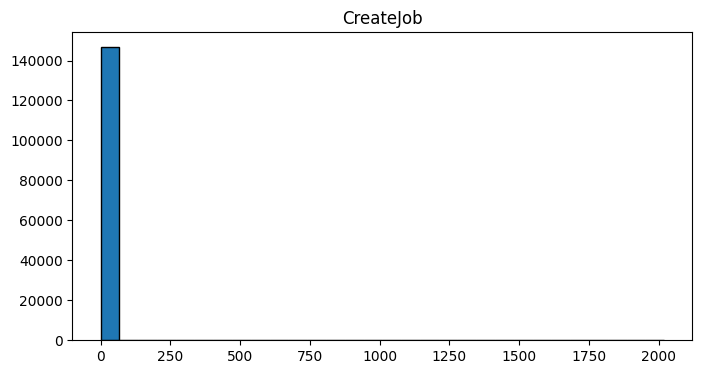

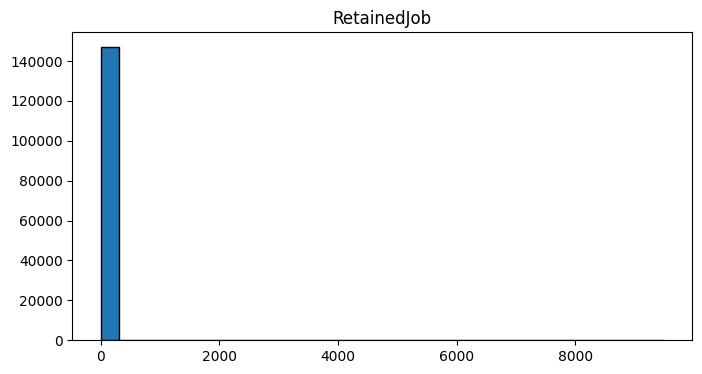

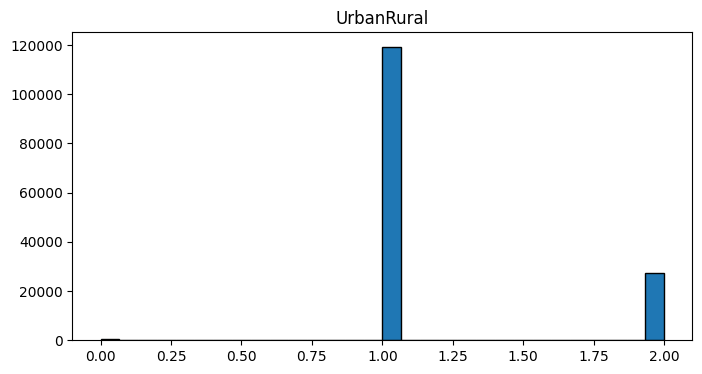

KeyError: 'DisbursementGross'

<Figure size 800x400 with 0 Axes>

In [ ]:
# Numerical columns

for col in num_cols:
    plt.figure(figsize=(8,4))
    plt.hist(df_cleaned[col], bins=30, edgecolor='black')
    plt.title(f"{col}")
    plt.show()

### **Visual Analysis**

In [ ]:
# categorical columns
df_cleaned[cat_cols].nunique()

,0
State,51
BankState,52
RevLineCr,3
MIS_Status,2


## ***Refresh Point***

In [ ]:
df_cleaned.shape

(147063, 18)

In [ ]:
cat_cols = df_cleaned.select_dtypes(include='object').columns
cat_cols

Index(['State', 'BankState', 'RevLineCr', 'MIS_Status'], dtype='object')

In [ ]:
num_cols = df_cleaned.select_dtypes(include=np.number).columns
num_cols

Index(['ApprovalFY', 'Term', 'NoEmp', 'NewExist', 'CreateJob', 'RetainedJob',
       'UrbanRural', 'BalanceGross', 'ChgOffPrinGr', 'GrAppv', 'Approval_Year',
       'Approval_Month', 'Disbursement_Year', 'Disbursement_Month'],
      dtype='object')

### ***(UNFINISHED) OUTLIER Detection***

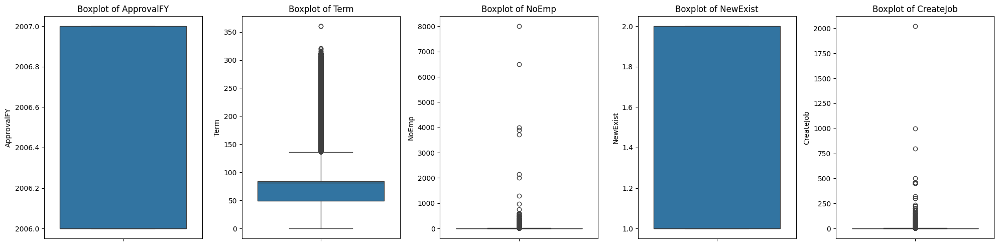

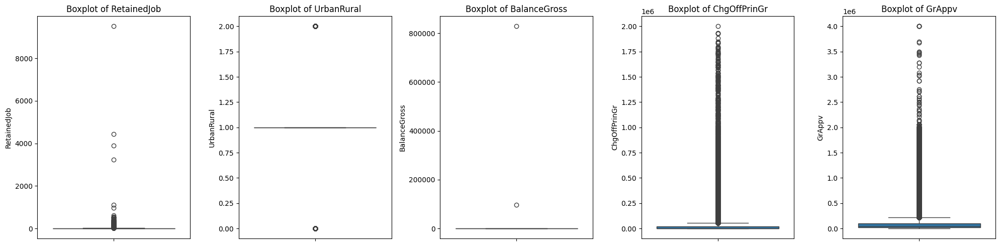

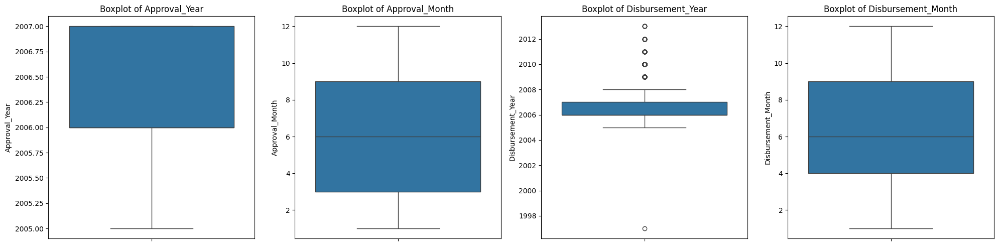

In [ ]:
batch_size = 5
num_batches = (len(num_cols) // batch_size) + (1 if len(num_cols) % batch_size else 0)

# Iterate over the numerical columns in batches
for batch in range(num_batches):
    start = batch * batch_size
    end = start + batch_size
    cols_batch = num_cols[start:end]

    # Create subplots for each batch
    fig, axes = plt.subplots(1, len(cols_batch), figsize=(20, 5))
    if len(cols_batch) == 1:  # In case only one subplot is created
        axes = [axes]

    for col, ax in zip(cols_batch, axes):
        sns.boxplot(data=df_cleaned, y=col, ax=ax)
        ax.set_title(f'Boxplot of {col}')

    plt.tight_layout()
    plt.show()

In [ ]:
# Percentage of Outliers
def calculate_outliers_iqr(df_cleaned):
    outliers_percentage = {}
    for column in num_cols:
        # calculating Inter quartile range values
        Q1 = df_cleaned[column].quantile(0.25)
        Q3 = df_cleaned[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        # using IQR lower and upper bound to extract outliers
        outliers = df_cleaned[(df_cleaned[column] < lower_bound) | (df_cleaned[column] > upper_bound)]
        percentage = round((len(outliers) / len(df_cleaned)) * 100, 2)
        outliers_percentage[column] = percentage
    return outliers_percentage

outliers_percentage = calculate_outliers_iqr(df_cleaned)
print("Percentage of outliers in each numerical column:")
print(outliers_percentage)


Percentage of outliers in each numerical column:
{'ApprovalFY': 0.0, 'Term': 7.94, 'NoEmp': 10.73, 'NewExist': 0.0, 'CreateJob': 8.94, 'RetainedJob': 9.01, 'UrbanRural': 18.94, 'BalanceGross': 0.0, 'ChgOffPrinGr': 9.76, 'GrAppv': 14.01, 'Approval_Year': 0.0, 'Approval_Month': 0.0, 'Disbursement_Year': 1.19, 'Disbursement_Month': 0.0}


In [ ]:
df_cleaned[num_cols].skew()

,0
ApprovalFY,0.057837
Term,2.022230
NoEmp,142.142823
NewExist,0.762900
CreateJob,43.454155
RetainedJob,200.314315
UrbanRural,1.503706
BalanceGross,376.341424
ChgOffPrinGr,9.336092
GrAppv,4.446316


### E. figure out how to adjust the scale of data in boxplot
also create another boxplot showing only columns with outliers for our presentations(For future not now)


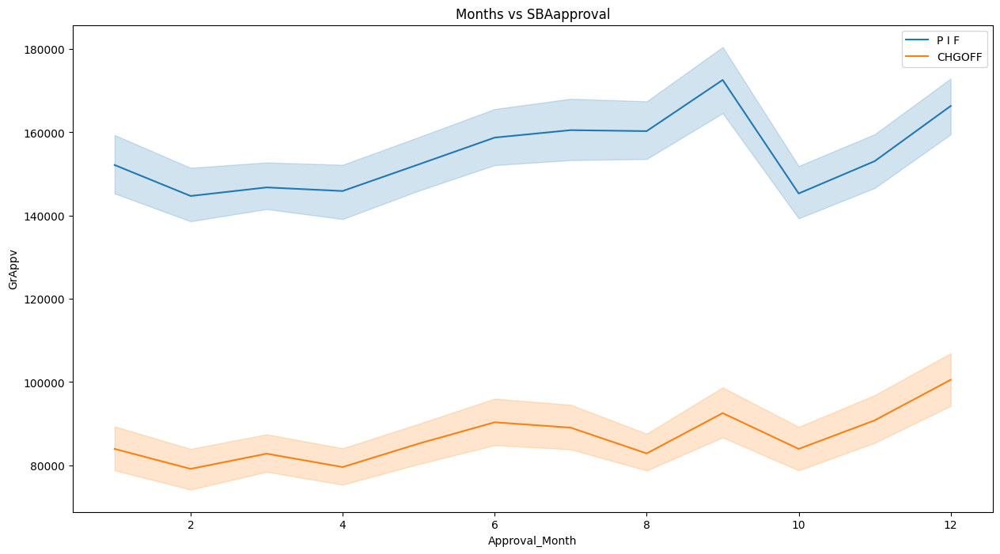

In [ ]:
# Checking seasonality in Loan applications
plt.figure(figsize=(15,8))
sns.lineplot(data=df_cleaned, x='Approval_Month', y='GrAppv', hue='MIS_Status')
plt.legend()
plt.title("Months vs SBAapproval")
plt.show()

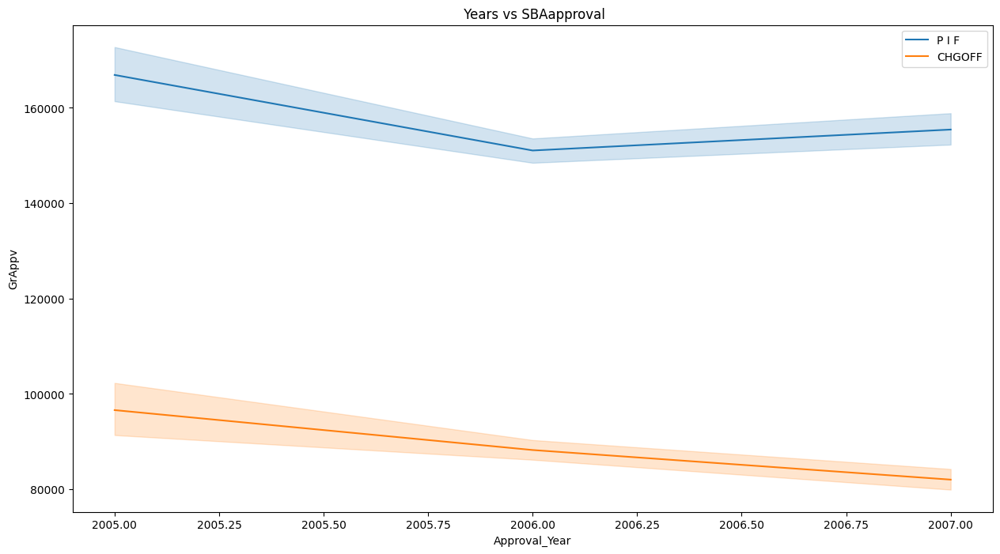

In [ ]:
plt.figure(figsize=(15,8))
sns.lineplot(data=df_cleaned, x='Approval_Year', y='GrAppv', hue='MIS_Status')
plt.legend()
plt.title(" Years vs SBAapproval")
plt.show()

### F. Observe if the outlier issue is solved in the above graph (Update: Solved since only 2 year data exists)

### *SavePoint*

In [ ]:
# npre encoded save point
#Save
df_cleaned.to_csv('SBAnational_100k_cleaned1.csv', index=False)

In [ ]:
#load
df_cleaned = pd.read_csv('SBAnational_100k_cleaned1.csv')

In [ ]:
cat_cols = df_cleaned.select_dtypes(include='object').columns

In [ ]:
num_cols = df_cleaned.select_dtypes(include=np.number).columns

## **2.Featue Engineering**

### *Encoding*

In [ ]:
df_cleaned['MIS_Status'] = df_cleaned['MIS_Status'].map({'P I F' : 0, 'CHGOFF': 1 })

In [ ]:
df_cleaned['MIS_Status'].value_counts()

,count
MIS_Status,
0,89996
1,57067


In [ ]:
df_cleaned['RevLineCr'].value_counts()

,count
RevLineCr,
Y,64928
N,46973
Unknown,35162


In [ ]:
df_cleaned['RevLineCr'] = df_cleaned['RevLineCr'].map({'Y' : 2, 'N': 1, 'Unknown': 0 })

In [ ]:
df_cleaned['RevLineCr'].value_counts()

,count
RevLineCr,
2,64928
1,46973
0,35162


In [ ]:
# Target Encoding
cat_high_cardinal = ['State', 'BankState']
for col in cat_high_cardinal:
    categ_means = df_cleaned.groupby(col)['MIS_Status'].mean()
    df_cleaned[col] = df_cleaned[col].map(categ_means)
    print(df_cleaned[col].value_counts())


State
0.483795    21352
0.383606    11736
0.355179    10620
0.552658     8859
0.428050     6574
0.304953     6037
0.298712     4968
0.430349     4903
0.448423     4440
0.529542     4079
0.338247     3663
0.320033     3609
0.375105     3583
0.257300     3459
0.307603     3433
0.486519     3375
0.304191     3054
0.242049     2830
0.314224     2756
0.416961     2547
0.416434     2507
0.420545     2385
0.325769     1983
0.318584     1695
0.466746     1684
0.303011     1594
0.511734     1534
0.285296     1367
0.283525     1305
0.335209     1244
0.261944     1214
0.245985     1183
0.259981     1027
0.435533      985
0.322259      903
0.355705      894
0.431793      887
0.193342      781
0.184797      763
0.344928      690
0.139319      646
0.223154      596
0.150000      520
0.282000      500
0.118026      466
0.272040      397
0.354054      370
0.207602      342
0.412844      327
0.108491      212
0.232432      185
Name: count, dtype: int64
BankState
0.512169    21571
0.429837    18065
0.47

In [ ]:
cat_cols = df_cleaned.select_dtypes(include='object').columns
cat_cols

Index([], dtype='object')

In [ ]:
num_cols = df_cleaned.select_dtypes(include=np.number).columns
num_cols

Index(['State', 'BankState', 'ApprovalFY', 'Term', 'NoEmp', 'NewExist',
       'CreateJob', 'RetainedJob', 'UrbanRural', 'RevLineCr', 'BalanceGross',
       'MIS_Status', 'ChgOffPrinGr', 'GrAppv', 'Approval_Year',
       'Approval_Month', 'Disbursement_Year', 'Disbursement_Month'],
      dtype='object')

In [ ]:
# cat encoded save point
#Save
df_cleaned.to_csv('SBAnational_100k_encoded.csv', index=False)

In [ ]:
#load
df_cleaned = pd.read_csv('SBAnational_100k_encoded.csv')

### *Scaling*

In [ ]:
# Warning: Do encoding before this!
col_names = df_cleaned.drop(columns=['MIS_Status']).columns
features = df_cleaned.drop(columns=['MIS_Status'])
target = df_cleaned['MIS_Status']

# Apply scaling only to the feature columns
scaler = StandardScaler()
scaled_features = scaler.fit_transform(features)

# Combine scaled features with the target column
df_scaled = pd.DataFrame(scaled_features, columns=col_names)
df_scaled['MIS_Status'] = target.reset_index(drop=True)

# Display the scaled dataset
df_scaled.head()


,State,BankState,ApprovalFY,Term,NoEmp,NewExist,CreateJob,RetainedJob,UrbanRural,RevLineCr,BalanceGross,ChgOffPrinGr,GrAppv,Approval_Year,Approval_Month,Disbursement_Year,Disbursement_Month,MIS_Status
0,0.310198,-1.718441,-0.9715,1.517024,-0.132353,1.451727,-0.168661,-0.176668,-0.467492,-1.503444,-0.002893,-0.288572,0.479715,-0.391443,-1.287581,-0.596476,-1.010077,0
1,-0.462532,-1.802783,-0.9715,0.856377,0.006085,-0.688835,-0.168661,-0.176668,-0.467492,-1.503444,-0.002893,-0.288572,0.035211,-0.391443,-1.287581,-0.596476,-0.716104,0
2,1.027153,0.439366,-0.9715,0.067271,0.310648,1.451727,0.182623,0.524203,-0.467492,0.997288,-0.002893,-0.288572,-0.107598,-0.391443,-1.287581,-0.596476,-1.304050,0
3,1.765870,0.301090,-0.9715,0.085622,-0.076978,-0.688835,-0.168661,-0.054777,-0.467492,0.997288,-0.002893,-0.288572,-0.356459,-0.391443,-1.287581,-0.596476,-1.304050,0
4,-0.566786,-2.125241,-0.9715,-0.354810,-0.104665,-0.688835,-0.168661,-0.176668,-0.467492,-0.253078,-0.002893,-0.288572,-0.299029,-0.391443,-1.287581,-0.596476,-0.422130,0


In [ ]:
df_scaled['MIS_Status'].value_counts()

,count
MIS_Status,
0,89996
1,57067


In [ ]:
df_scaled.shape

(147063, 18)

### *Heatmap(Encoded and Scaled Data)*

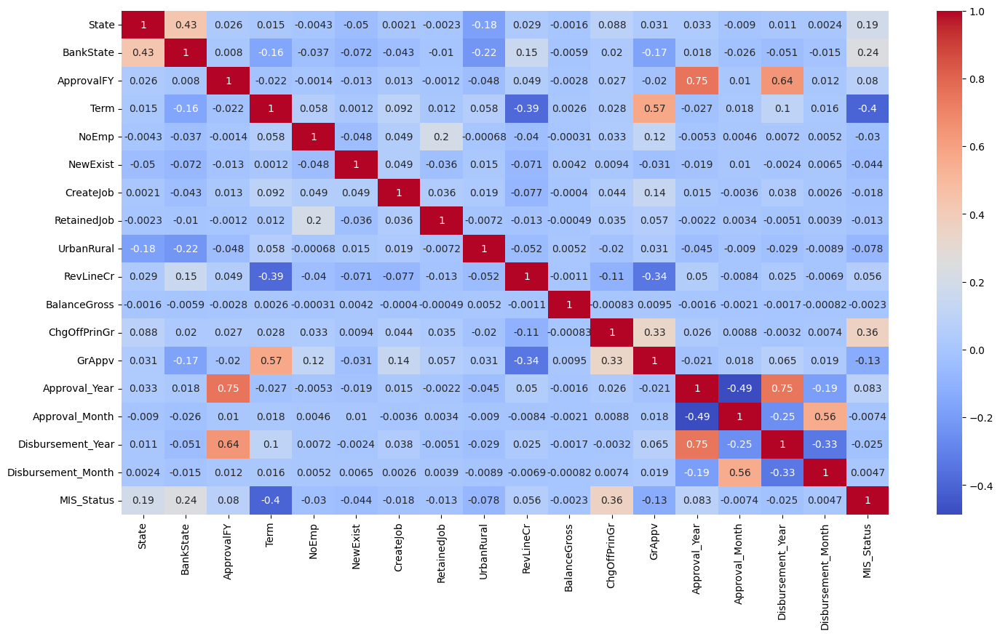

In [ ]:
# ! this is heatmap after scaling so it includes previous categorical features.
corr_matrix = df_scaled.corr()
plt.figure(figsize=(17,9))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.show()

### *Transforming(reducing skewness)*

### ***Save Load Point(Current progress)***

In [ ]:
df_scaled.skew()# needed for only num columns

,0
State,-0.120395
BankState,-0.734413
ApprovalFY,0.057837
Term,2.022230
NoEmp,142.142823
NewExist,0.762900
CreateJob,43.454155
RetainedJob,200.314315
UrbanRural,1.503706
RevLineCr,-0.379781


In [ ]:
df_scaled.shape

(147063, 18)

## **Final EDA file**

In [ ]:
#Save
df_scaled.to_csv('SBAnational_100k_final_EDA.csv', index=False)

In [ ]:
#load
df_scaled = pd.read_csv('/content/SBAnational_100k_final_EDA.xls')

### **Splitting the final data into train and test data**

In [ ]:
# Extract 100,000 samples for the training DataFrame
training_df = df_scaled.sample(n=100000, random_state=42)

# Get the remaining samples for the test DataFrame
testing_df = df_scaled.drop(training_df.index)

In [ ]:
training_df.shape

(100000, 18)

In [ ]:
testing_df.shape

(47063, 18)

## **Model Building**

In [ ]:
# stratify = y splitting train and test base
X = training_df.drop(columns=['MIS_Status'])
y = training_df['MIS_Status']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)


In [ ]:
#2 training with multiple models
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.svm import SVC

# Define the models
models = {
    'Logistic Regression': LogisticRegression(multi_class='ovr'),
    'Random Forest': RandomForestClassifier(),
    'XGBoost': XGBClassifier(),
    #'SVM': SVC(probability=True)  # Enable probability estimates for AUC
}

# Train the models and store predictions
model_preds = {}

for name, model in models.items():
    model.fit(X_train, y_train)
    model_preds[name] = model.predict(X_test)
    print("yes")

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


yes
yes
yes


In [ ]:
#3 evaluating our trained models
def evaluate_model(y_true, y_pred):
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='weighted')
    recall = recall_score(y_true, y_pred, average='weighted')
    f1 = f1_score(y_true, y_pred, average='weighted')
    #roc_auc = roc_auc_score(y_true, y_pred, multi_class='ovr')

    return accuracy, precision, recall, f1

# Compare models
for name, preds in model_preds.items():
    accuracy, precision, recall, f1 = evaluate_model(y_test, preds)
    print(f"{name} - Accuracy: {accuracy:.4f}, Precision: {precision:.4f}, Recall: {recall:.4f}, F1-score: {f1:.4f}")

Logistic Regression - Accuracy: 0.9781, Precision: 0.9781, Recall: 0.9781, F1-score: 0.9781
Random Forest - Accuracy: 0.9892, Precision: 0.9895, Recall: 0.9892, F1-score: 0.9892
XGBoost - Accuracy: 0.9885, Precision: 0.9887, Recall: 0.9885, F1-score: 0.9885


In [ ]:
# Classification report
for name, preds in model_preds.items():
    report = classification_report(y_test, preds, target_names=['Class 0', 'Class 1'])
    print(f"{name}:\n{report}")

Logistic Regression:
              precision    recall  f1-score   support

     Class 0       0.98      0.98      0.98     18267
     Class 1       0.97      0.97      0.97     11733

    accuracy                           0.98     30000
   macro avg       0.98      0.98      0.98     30000
weighted avg       0.98      0.98      0.98     30000

Random Forest:
              precision    recall  f1-score   support

     Class 0       1.00      0.98      0.99     18267
     Class 1       0.97      1.00      0.99     11733

    accuracy                           0.99     30000
   macro avg       0.99      0.99      0.99     30000
weighted avg       0.99      0.99      0.99     30000

XGBoost:
              precision    recall  f1-score   support

     Class 0       1.00      0.98      0.99     18267
     Class 1       0.97      1.00      0.99     11733

    accuracy                           0.99     30000
   macro avg       0.99      0.99      0.99     30000
weighted avg       0.99      

### **metrics on testing dataset**

In [ ]:
def evaluate_model(y_true, y_pred):
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='weighted')
    recall = recall_score(y_true, y_pred, average='weighted')
    f1 = f1_score(y_true, y_pred, average='weighted')
    #roc_auc = roc_auc_score(y_true, y_pred, multi_class='ovr')

    return accuracy, precision, recall, f1

# Compare models
for name, preds in model_preds.items():
    accuracy, precision, recall, f1 = evaluate_model(y_test, preds)
    print(f"{name} - Accuracy: {accuracy:.4f}, Precision: {precision:.4f}, Recall: {recall:.4f}, F1-score: {f1:.4f}")


Logistic Regression - Accuracy: 0.9781, Precision: 0.9781, Recall: 0.9781, F1-score: 0.9781
Random Forest - Accuracy: 0.9892, Precision: 0.9895, Recall: 0.9892, F1-score: 0.9892
XGBoost - Accuracy: 0.9885, Precision: 0.9887, Recall: 0.9885, F1-score: 0.9885


Predictions on Unknown data

In [ ]:
X = testing_df.drop(columns=['MIS_Status'])
y = testing_df['MIS_Status']

In [ ]:
# Predict on the testing dataset
model_preds_testing = {}
for name, model in models.items():
    model_preds_testing[name] = model.predict(X)

# Evaluate the models on the testing dataset
for name, preds in model_preds_testing.items():
    accuracy, precision, recall, f1 = evaluate_model(y, preds)
    print(f"{name} - Accuracy: {accuracy:.4f}, Precision: {precision:.4f}, Recall: {recall:.4f}, F1-score: {f1:.4f}")

# Classification report for testing dataset
for name, preds in model_preds_testing.items():
    report = classification_report(y, preds, target_names=['Class 0', 'Class 1'])
    print(f"{name}:\n{report}")

Logistic Regression - Accuracy: 0.9778, Precision: 0.9778, Recall: 0.9778, F1-score: 0.9778
Random Forest - Accuracy: 0.9888, Precision: 0.9891, Recall: 0.9888, F1-score: 0.9889
XGBoost - Accuracy: 0.9881, Precision: 0.9884, Recall: 0.9881, F1-score: 0.9881
Logistic Regression:
              precision    recall  f1-score   support

     Class 0       0.98      0.98      0.98     28951
     Class 1       0.97      0.97      0.97     18112

    accuracy                           0.98     47063
   macro avg       0.98      0.98      0.98     47063
weighted avg       0.98      0.98      0.98     47063

Random Forest:
              precision    recall  f1-score   support

     Class 0       1.00      0.98      0.99     28951
     Class 1       0.97      1.00      0.99     18112

    accuracy                           0.99     47063
   macro avg       0.99      0.99      0.99     47063
weighted avg       0.99      0.99      0.99     47063

XGBoost:
              precision    recall  f1-score

Model Training for USL

In [ ]:
# stratify = y splitting train and test base
X = training_df.drop(columns=['MIS_Status'])
y = training_df['MIS_Status']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=10)

In [ ]:
from sklearn.decomposition import PCA

#Performing PCA to two PC for clustering problems
pca = PCA(n_components=2)
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

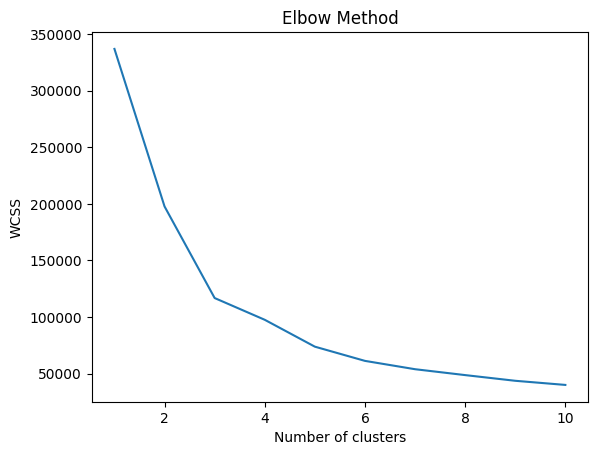

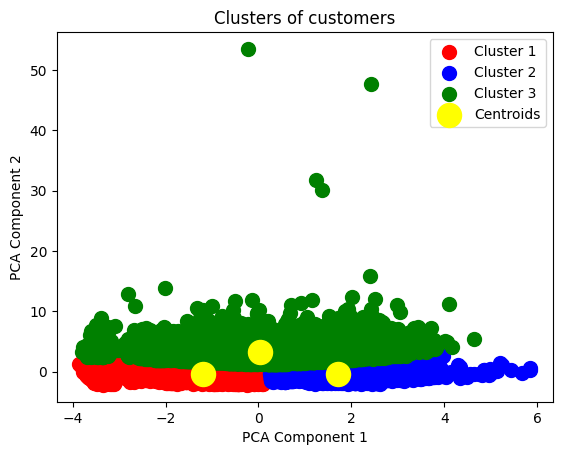

In [ ]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Determine optimal k using Elbow method
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', random_state=42)
    kmeans.fit(X_train_pca)
    wcss.append(kmeans.inertia_)

plt.plot(range(1, 11), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

optimal_k = 3

# Perform KMeans clustering with the optimal k
kmeans = KMeans(n_clusters=optimal_k, init='k-means++', random_state=42)
y_kmeans = kmeans.fit_predict(X_train_pca)

# Visualize the clusters
plt.scatter(X_train_pca[y_kmeans == 0, 0], X_train_pca[y_kmeans == 0, 1], s=100, c='red', label='Cluster 1')
plt.scatter(X_train_pca[y_kmeans == 1, 0], X_train_pca[y_kmeans == 1, 1], s=100, c='blue', label='Cluster 2')
plt.scatter(X_train_pca[y_kmeans == 2, 0], X_train_pca[y_kmeans == 2, 1], s=100, c='green', label='Cluster 3')
# Add more scatter plots for additional clusters if optimal_k > 3


plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s=300, c='yellow', label='Centroids')
plt.title('Clusters of customers')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import silhouette_score

sil_score = silhouette_score(X_train_pca, y_kmeans)
print(f'Silhouette Score: {sil_score}')

Silhouette Score: 0.5174256489072948


In [ ]:
# Assign cluster labels to the dataframe for analysis
X_train_clustered = X_train.copy()
X_train_clustered['Cluster'] = y_kmeans

# calculate the summary statistics for each cluster
cluster_summary = X_train_clustered.groupby('Cluster').mean()

# Print the cluster summary
print(cluster_summary)

            State  BankState  ApprovalFY      Term     NoEmp  NewExist  \
Cluster                                                                  
0       -0.011416   0.093871   -0.671271 -0.272271 -0.037474  0.010958   
1        0.040640   0.093864    0.969145 -0.249643 -0.041258 -0.008682   
2       -0.063837  -0.715359   -0.042188  2.114327  0.346491 -0.050831   

         CreateJob  RetainedJob  UrbanRural  RevLineCr  BalanceGross  \
Cluster                                                                
0        -0.066749    -0.016053    0.012494   0.113234     -0.001678   
1        -0.060413    -0.018950   -0.109220   0.200593     -0.002893   
2         0.551065     0.115071    0.304717  -1.222882     -0.002893   

         ChgOffPrinGr    GrAppv  Approval_Year  Approval_Month  \
Cluster                                                          
0           -0.098289 -0.242950      -0.688653        0.206892   
1           -0.063068 -0.250459       1.001758       -0.306858   
2   

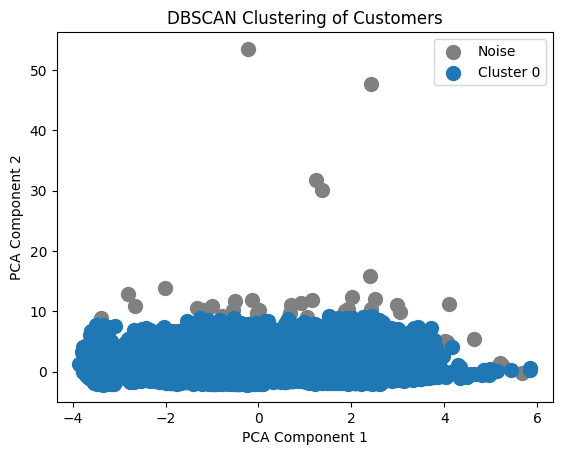

DBSCAN Cluster Summary:
             State  BankState  ApprovalFY      Term      NoEmp  NewExist  \
Cluster                                                                   
-1       0.135029  -0.450069    0.329043  1.928094  17.190355 -0.207208   
 0       0.001769   0.004998   -0.002341 -0.002233  -0.006393 -0.002912   

         CreateJob  RetainedJob  UrbanRural  RevLineCr  BalanceGross  \
Cluster                                                                
-1       12.442430     0.481541    0.166693  -0.972038     -0.002893   
 0       -0.003496    -0.002947    0.000079  -0.001432     -0.002256   

         ChgOffPrinGr    GrAppv  Approval_Year  Approval_Month  \
Cluster                                                          
-1           4.195446  6.125879       0.152681        0.080961   
 0           0.000610 -0.005492       0.001773       -0.000492   

         Disbursement_Year  Disbursement_Month  
Cluster                                         
-1                1.35

In [ ]:
from sklearn.cluster import DBSCAN

# DBSCAN clustering
dbscan = DBSCAN(eps=0.5, min_samples=5)
y_dbscan = dbscan.fit_predict(X_train_pca)

# Visualize the DBSCAN clustering
plt.scatter(X_train_pca[y_dbscan == -1, 0], X_train_pca[y_dbscan == -1, 1], s=100, c='gray', label='Noise')
for cluster_label in set(y_dbscan):
    if cluster_label != -1:
        plt.scatter(X_train_pca[y_dbscan == cluster_label, 0], X_train_pca[y_dbscan == cluster_label, 1], s=100, label=f'Cluster {cluster_label}')

plt.title('DBSCAN Clustering of Customers')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend()
plt.show()

# Add DBSCAN labels to the dataframe for analysis
X_train_clustered_dbscan = X_train.copy()
X_train_clustered_dbscan['Cluster'] = y_dbscan

# Summarize clusters - calculate mean of features for each cluster
cluster_summary_dbscan = X_train_clustered_dbscan.groupby('Cluster').mean()

# Print the cluster summary
print("DBSCAN Cluster Summary:\n", cluster_summary_dbscan)


Study of Gross Approved feature with the rest of the features using Scatter plots

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


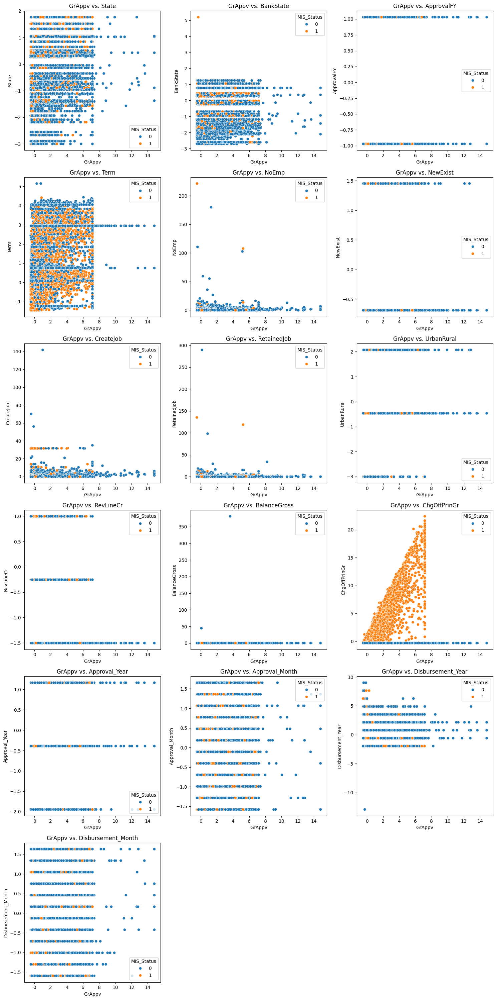

In [ ]:
#To study the relation of SBA approved loan vs the other features with hue as the MIS Status as charged off or paid in full
def plot_scatter_subplots(df, target_column='GrAppv', hue_column='MIS_Status'):

    columns_to_plot = ['State', 'BankState', 'ApprovalFY', 'Term', 'NoEmp', 'NewExist',
       'CreateJob', 'RetainedJob', 'UrbanRural', 'RevLineCr', 'BalanceGross',
       'ChgOffPrinGr', 'Approval_Year', 'Approval_Month',
       'Disbursement_Year', 'Disbursement_Month']

    num_plots = len(columns_to_plot)
    num_cols = 3
    num_rows = (num_plots + num_cols - 1) // num_cols

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows))
    axes = axes.flatten()


    for i, col in enumerate(columns_to_plot):
        sns.scatterplot(data=df, x=target_column, y=col, hue=hue_column, ax=axes[i])
        axes[i].set_title(f'{target_column} vs. {col}')

    #Turn off any unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].set_axis_off()

    plt.tight_layout()
    plt.show()


plot_scatter_subplots(df_scaled)

<ipython-input-145-caa8cd7fedde>:8: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(X_train_clustered[feature], kde=True)  # Plot the distribution


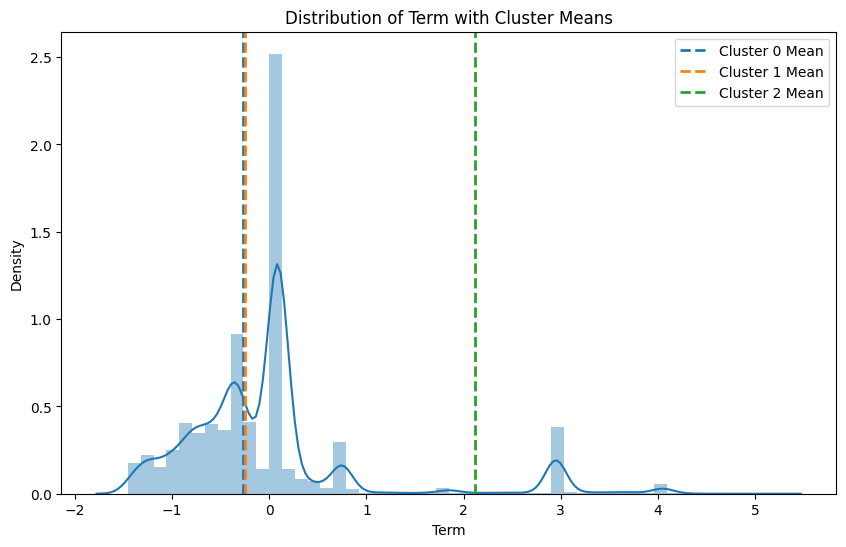

<ipython-input-145-caa8cd7fedde>:8: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(X_train_clustered[feature], kde=True)  # Plot the distribution


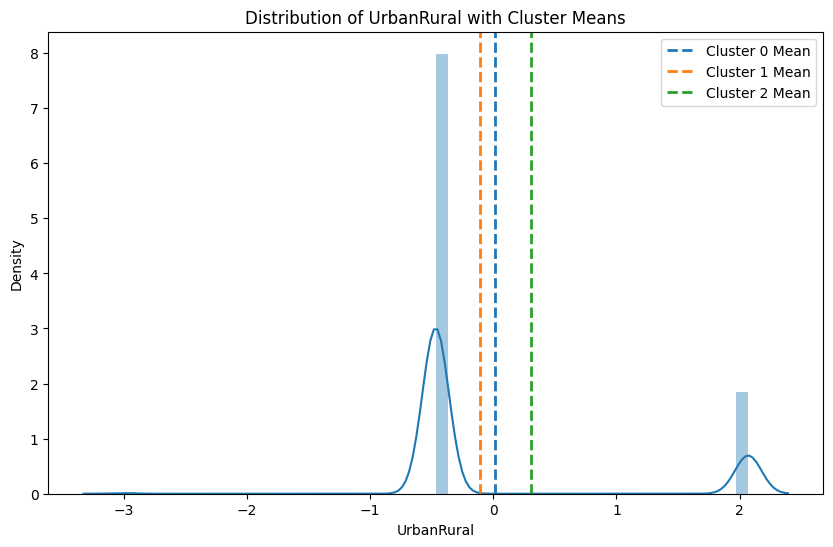

<ipython-input-145-caa8cd7fedde>:8: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(X_train_clustered[feature], kde=True)  # Plot the distribution


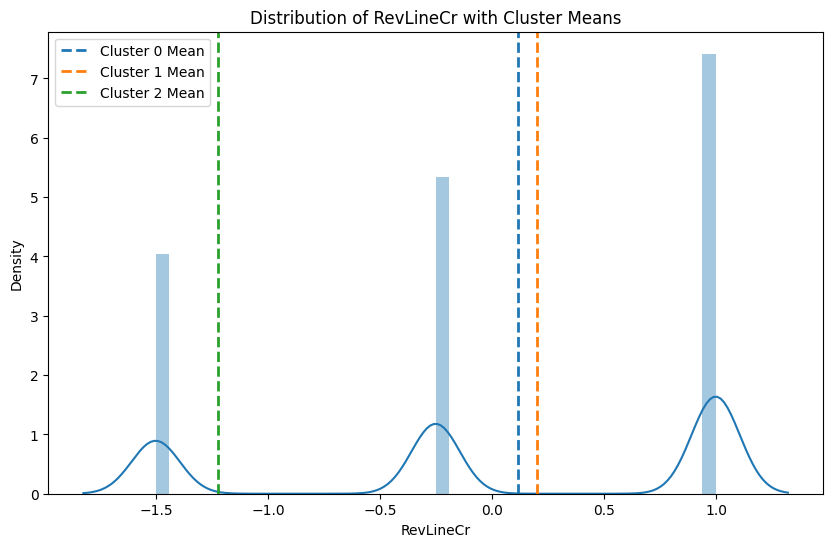

<ipython-input-145-caa8cd7fedde>:8: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(X_train_clustered[feature], kde=True)  # Plot the distribution


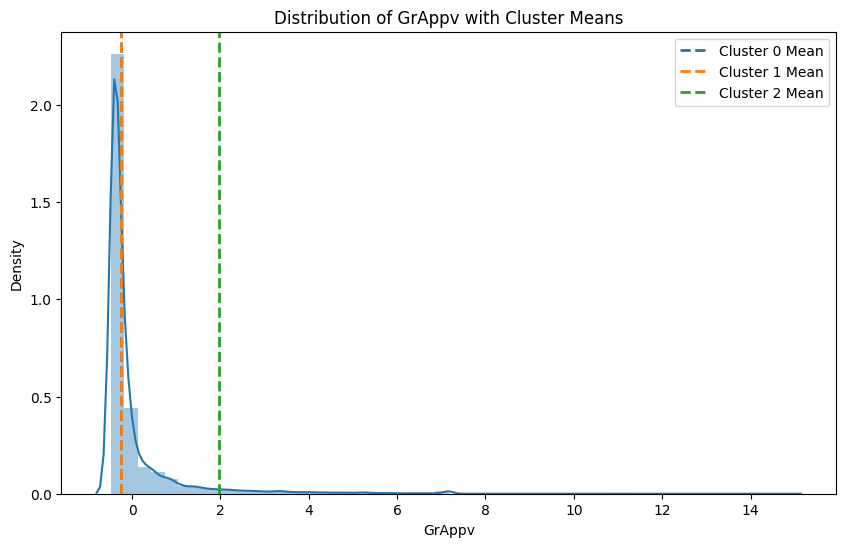

In [ ]:
import seaborn as sns


features_to_plot = ['Term', 'UrbanRural', 'RevLineCr', 'GrAppv']

for feature in features_to_plot:
    plt.figure(figsize=(10, 6))
    sns.distplot(X_train_clustered[feature], kde=True)  # Plot the distribution

    # Add vertical lines for cluster means
    for cluster in cluster_summary.index:
      plt.axvline(cluster_summary.loc[cluster, feature], color=f'C{cluster}', linestyle='dashed', linewidth=2, label=f'Cluster {cluster} Mean')

    plt.title(f'Distribution of {feature} with Cluster Means')
    plt.xlabel(feature)
    plt.ylabel('Density')
    plt.legend()
    plt.show()

<ipython-input-147-07a2e5a26c91>:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(X_train_clustered[feature], kde=True)  # Plot the distribution


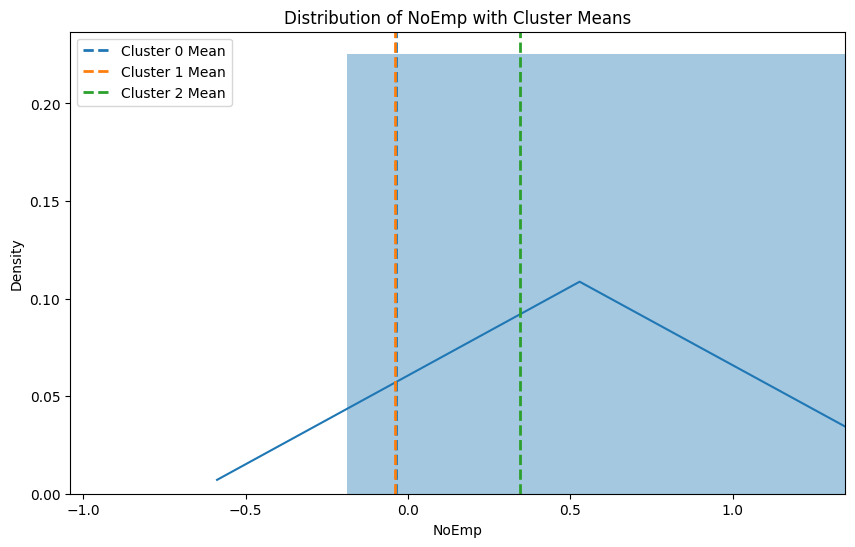

<ipython-input-147-07a2e5a26c91>:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(X_train_clustered[feature], kde=True)  # Plot the distribution


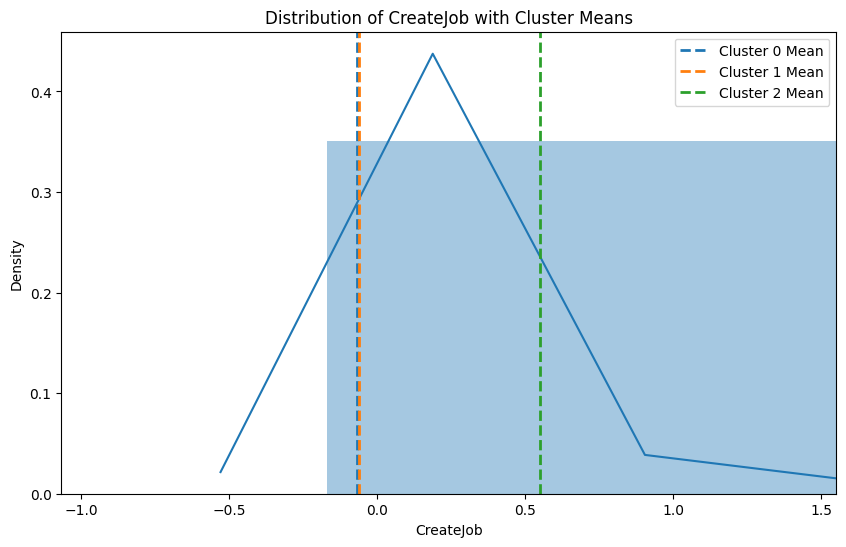

In [ ]:
features_to_plot = ['NoEmp', 'CreateJob']

for feature in features_to_plot:
    plt.figure(figsize=(10, 6))
    sns.distplot(X_train_clustered[feature], kde=True)  # Plot the distribution

    # Add vertical lines for cluster means
    for cluster in cluster_summary.index:
        plt.axvline(cluster_summary.loc[cluster, feature], color=f'C{cluster}', linestyle='dashed', linewidth=2, label=f'Cluster {cluster} Mean')

    plt.title(f'Distribution of {feature} with Cluster Means')
    plt.xlabel(feature)
    plt.ylabel('Density')
    plt.legend()
    plt.xlim(cluster_summary[feature].min() - 1, cluster_summary[feature].max() + 1) # Adjust x-axis limits for zoom
    plt.show()

The insights as follows from the normal distribution graphs made for each feature along with the mean of clusters as vertical lines standing in each feature : The businesses taking higher approved loans were creating more jobs, had more no. Of  employees, had a longer loan term duration, had more urban rural exposure, had less no. of revolving line of credit. Whereas on the other hand there are business that has differented by the no. of revolving line of credi they have and the urban rural exposure. This clearly indicates us that there are 3 distinct types of clusters and each have unique feature or features based on which they have been clustered together.